In [19]:
import plotly.graph_objects as go

In [20]:
def make_cube_triangle(x, y, z, size):
    # array of cube vertecies
    cube = [
        [x, y, z],
        [x + size, y, z],
        [x + size, y + size, z],
        [x, y + size, z],
        [x, y, z + size], 
        [x + size, y, z + size],
        [x + size, y + size, z + size],
        [x, y + size, z + size]
    ]

    # array of all six faces of the cube
    faces = [
        [cube[0], cube[1], cube[2], cube[3]],
        [cube[0], cube[1], cube[5], cube[4]],
        [cube[0], cube[3], cube[7], cube[4]],
        [cube[4], cube[5], cube[6], cube[7]],
        [cube[1], cube[2], cube[6], cube[5]],
        [cube[2], cube[3], cube[7], cube[6]]
    ]
    return faces

In [21]:
def make_cube_cube(x, y, z, size):
    # array of cube vertecies
    cube = [
        [x, y, z],
        [x + size, y, z],
        [x + size, y + size, z],
        [x, y + size, z],
        [x, y, z + size], 
        [x + size, y, z + size],
        [x + size, y + size, z + size],
        [x, y + size, z + size]
    ]

    # plotly is only can draw triangle faces, so we make a "square" face, by separating it on two triangle ones
    faces = [
        [cube[0], cube[1], cube[5]],
        [cube[0], cube[5], cube[4]],
        [cube[2], cube[3], cube[7]],
        [cube[2], cube[7], cube[6]],
        [cube[0], cube[3], cube[7]],
        [cube[0], cube[7], cube[4]],
        [cube[1], cube[2], cube[6]],
        [cube[1], cube[6], cube[5]],
        [cube[0], cube[1], cube[2]],
        [cube[0], cube[2], cube[3]],
        [cube[4], cube[5], cube[6]],
        [cube[4], cube[6], cube[7]]
    ]
    return faces
    

In [22]:
def menger_sponge_triangle(x, y, z, size, iterations):
    # if iterations is 0, than we get a small enough cube
    if (iterations == 0):
        return make_cube_triangle(x, y, z, size)

    # we need to get cubes 3 times smaller
    size = size / 3
    faces = []

    # in this way we achive separtion of big cube, for 27 smaller once
    for i in range(3):
        for j in range(3):
            for k in range(3):
                # ignore middle cubes, they will not be in the answer
                if (((i == 1) and (j == 1)) or ((i == 1) and (k == 1)) or ((j == 1) and (k == 1))):
                    continue
                # here we get all faces to represent this part of the cube    
                faces.extend(menger_sponge_triangle(x + size*i, y + size*j, z + size*k, size, iterations-1))

    return faces

In [23]:
def menger_sponge_cube(x, y, z, size, iterations):
    if (iterations == 0):
        return make_cube_cube(x, y, z, size)

    size = size / 3
    faces = []

    for i in range(3):
        for j in range(3):
            for k in range(3):
                if (((i == 1) and (j == 1)) or ((i == 1) and (k == 1)) or ((j == 1) and (k == 1))):
                    continue
                faces.extend(menger_sponge_cube(x + size*i, y + size*j, z + size*k, size, iterations-1))

    return faces

In [31]:
def reversed_menger_sponge_cube(x, y, z, size, iterations):
    if (iterations == 0):
        return make_cube_cube(x, y, z, size)

    size = size / 3
    faces = []

    for i in range(3):
        for j in range(3):
            for k in range(3):
                if (not(((i == 1) and (j == 1)) or ((i == 1) and (k == 1)) or ((j == 1) and (k == 1)))):
                    continue
                faces.extend(reversed_menger_sponge_cube(x + size*i, y + size*j, z + size*k, size, iterations-1))

    return faces

In [25]:
def draw_menger_sponge_triangle(iterations):
    faces = menger_sponge_triangle(0, 0, 0, 1, iterations)

    # x/y/z_vals represent points on the grid, while i/j/k_values represent
    # which point will be connected and create a face on the image
    # so points (x_vals[i], y_vals[i], z_vals[i]), (x_vals[j], y_vals[j], z_vals[j]),
    # (x_vals[k], y_vals[k], z_vals[k]) will be connected into one face at the image
    x_vals, y_vals, z_vals, i_vals, j_vals, k_vals = [], [], [], [], [], []

    for it, face in enumerate(faces):
        for vertex in face:
            x_vals.append(vertex[0])
            y_vals.append(vertex[1])
            z_vals.append(vertex[2])
        for _ in range(4):  # kind of strange stuf, still can't get what the porpouse of this for
            i_vals.append(4*it)
            j_vals.append(4*it + 1)
            k_vals.append(4*it + 2)

    mesh = go.Mesh3d(x=x_vals, y=y_vals, z=z_vals,
                     i=i_vals, j=j_vals, k=k_vals,
                     opacity=0.5, color='cyan')
    layout = go.Layout(scene=dict(aspectmode="cube"))
    figure = go.Figure(data=[mesh], layout=layout)
    figure.show()

In [26]:
def draw_menger_sponge_cube(iterations):
    faces = menger_sponge_cube(0, 0, 0, 1, iterations)

    x_vals, y_vals, z_vals, i_vals, j_vals, k_vals = [], [], [], [], [], []

    for it, face in enumerate(faces):
        for vertex in face:
            x_vals.append(vertex[0])
            y_vals.append(vertex[1])
            z_vals.append(vertex[2])
        if len(i_vals) < len(x_vals): # kind of strange stuf, still can't get what the porpouse of this if (it seems that without it, and with for we are getting the same result)
            i_vals.append(3*it)
            j_vals.append(3*it + 1)
            k_vals.append(3*it + 2)

    mesh = go.Mesh3d(x=x_vals, y=y_vals, z=z_vals,
                     i=i_vals, j=j_vals, k=k_vals, facecolor=['cyan']*len(i_vals))
    layout = go.Layout(scene=dict(aspectmode="cube"))
    figure = go.Figure(data=[mesh], layout=layout)
    figure.show()

In [27]:
def draw_reversed_menger_sponge_cube(iterations):
    faces = reversed_menger_sponge_cube(0, 0, 0, 1, iterations)

    x_vals, y_vals, z_vals, i_vals, j_vals, k_vals = [], [], [], [], [], []

    for it, face in enumerate(faces):
        for vertex in face:
            x_vals.append(vertex[0])
            y_vals.append(vertex[1])
            z_vals.append(vertex[2])
        if len(i_vals) < len(x_vals): # kind of strange stuf, still can't get what the porpouse of this if (it seems that without it, and with for we are getting the same result)
            i_vals.append(3*it)
            j_vals.append(3*it + 1)
            k_vals.append(3*it + 2)

    mesh = go.Mesh3d(x=x_vals, y=y_vals, z=z_vals,
                     i=i_vals, j=j_vals, k=k_vals, facecolor=['cyan']*len(i_vals))
    layout = go.Layout(scene=dict(aspectmode="cube"))
    figure = go.Figure(data=[mesh], layout=layout)
    figure.show()

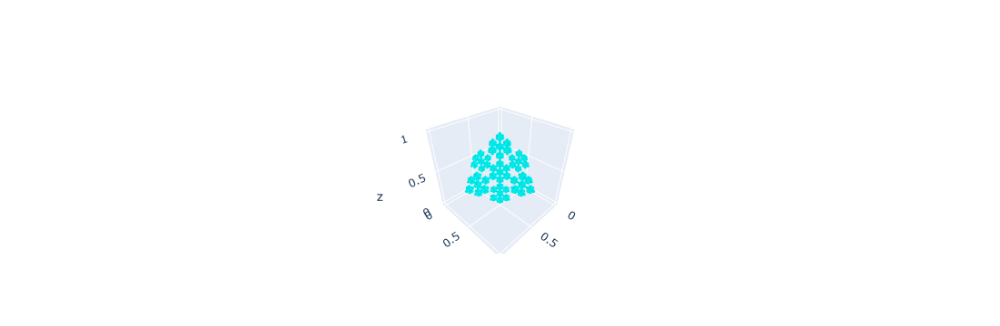

In [33]:
draw_reversed_menger_sponge_cube(4)

In [34]:
draw_menger_sponge_cube(4)